In [24]:
import pandas as pd
import os
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

In [25]:
df = pd.read_csv(r"C:\Users\nicks\OneDrive\Desktop\weatherscripts\openmateo.csv")

In [26]:
for x, y in enumerate(df['time']):
    datetime_object = datetime.strptime(y, '%m/%d/%Y')    
    df['time'][x] = datetime_object

C:\Users\nicks\AppData\Local\Temp\ipykernel_16632\889994824.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time'][x] = datetime_object
C:\Users\nicks\AppData\Local\Temp\ipykernel_16632\889994824.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time'][x] = datetime_object
C:\Users\nicks\AppData\Local\Temp\ipykernel_16632\889994824.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time'][x] = datetime_object
C:\User

## Visualization between cities ##

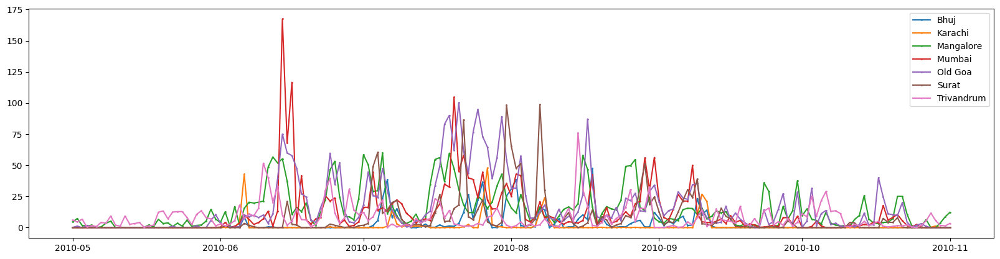

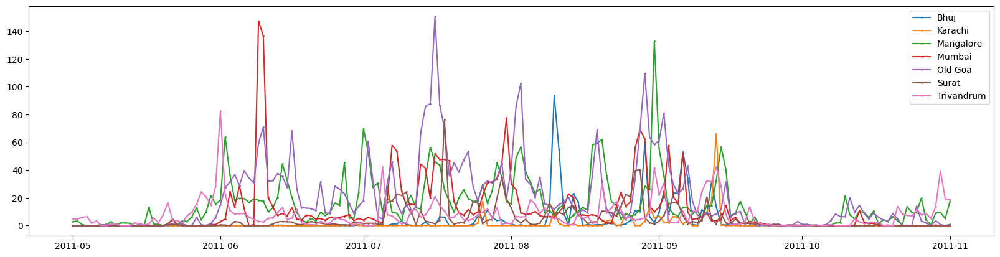

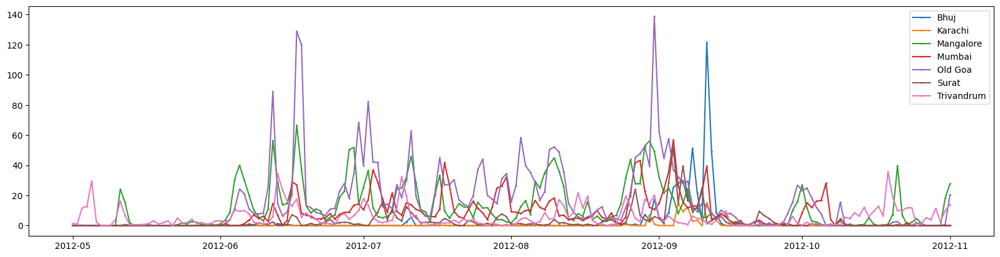

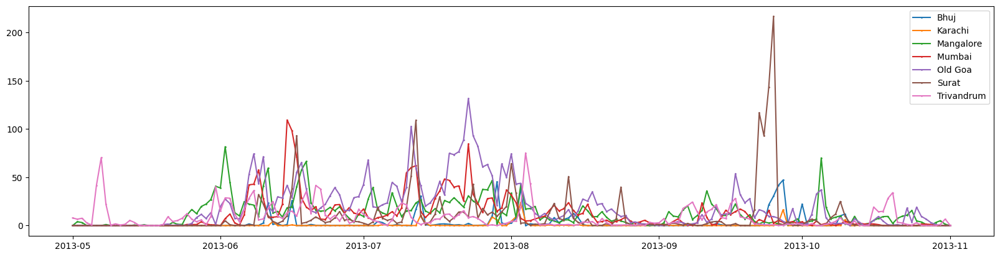

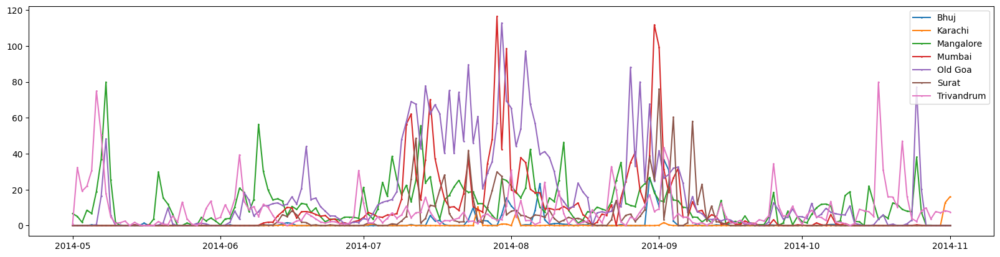

...

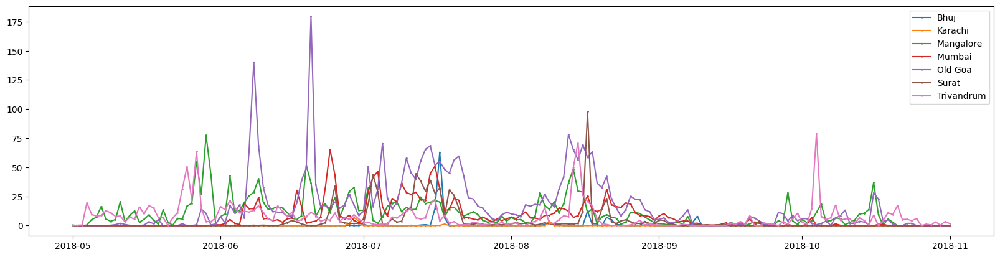

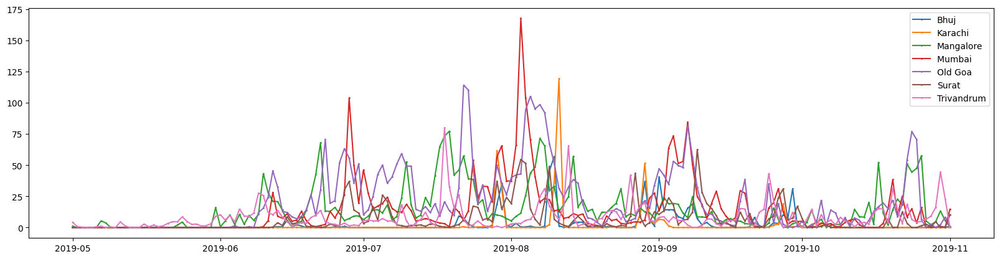

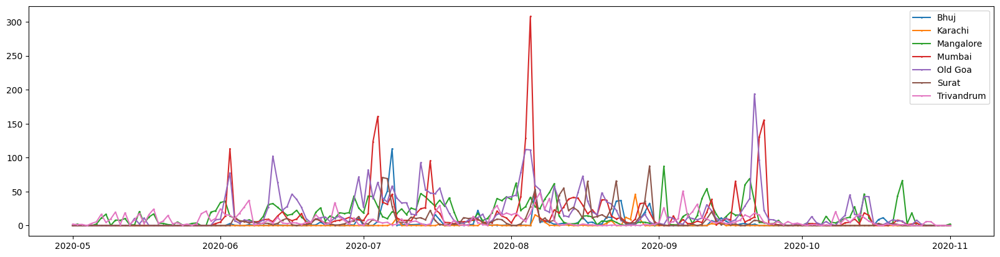

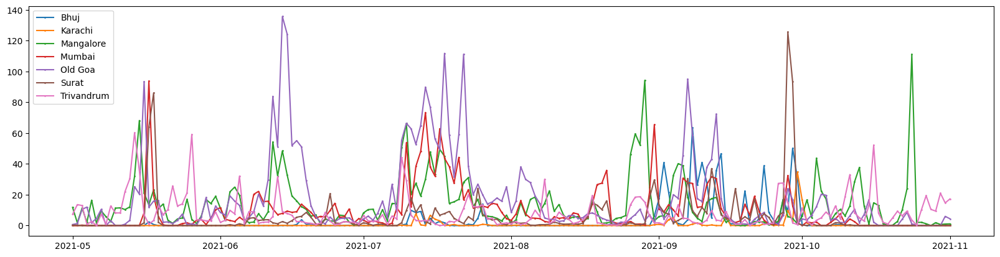

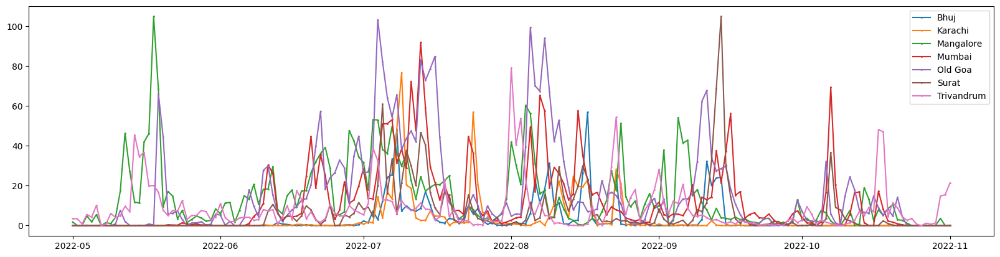

In [27]:
for year in range(2010, 2023):
    dfyear = df[(df['time'] >= datetime.strptime('05/01/{}'.format(year), '%m/%d/%Y')) & (df['time'] <= datetime.strptime('11/01/{}'.format(year), '%m/%d/%Y'))]
    plt.figure().set_figwidth(20)
    for city, group_data in dfyear.groupby('city'):
        plt.plot_date(group_data['time'], group_data['precipitation_sum'], ls = '-', ms = 1, label = city)
    plt.legend()
    plt.show()


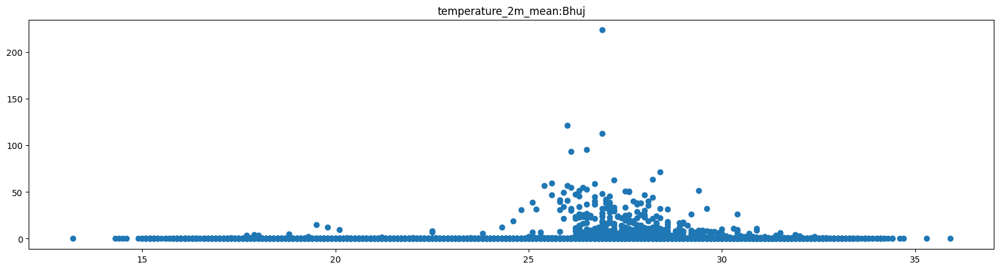

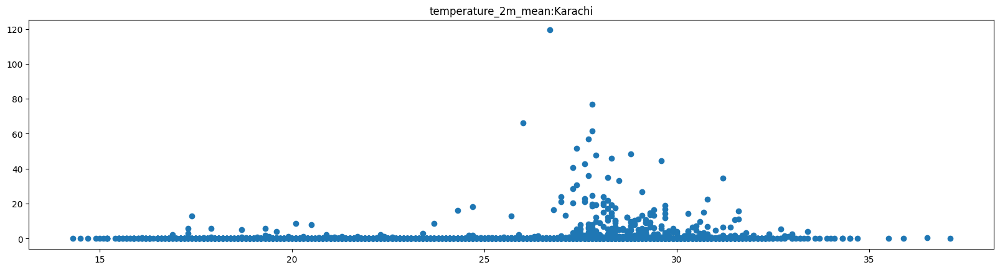

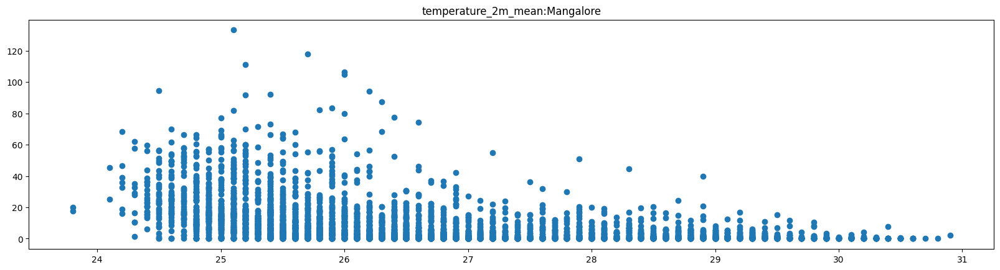

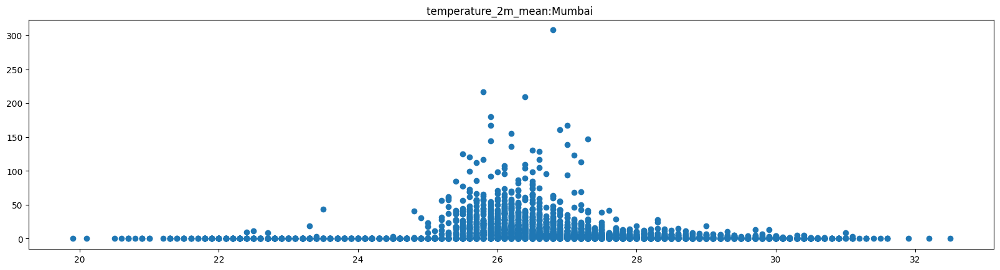

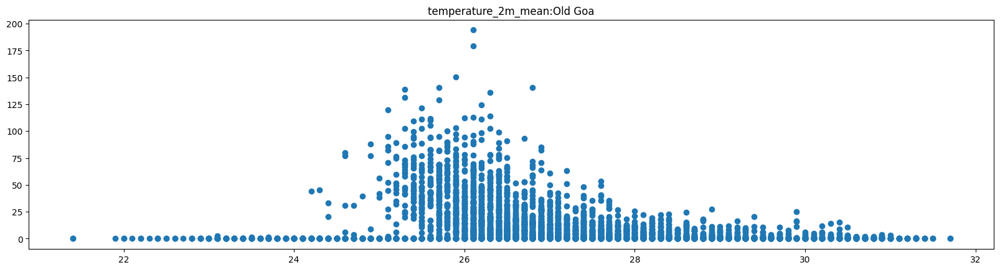

...

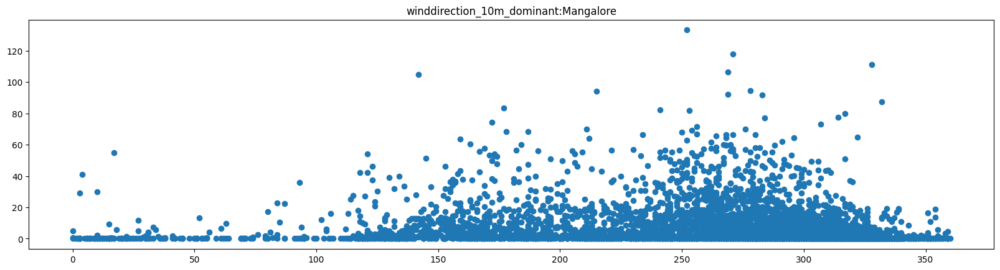

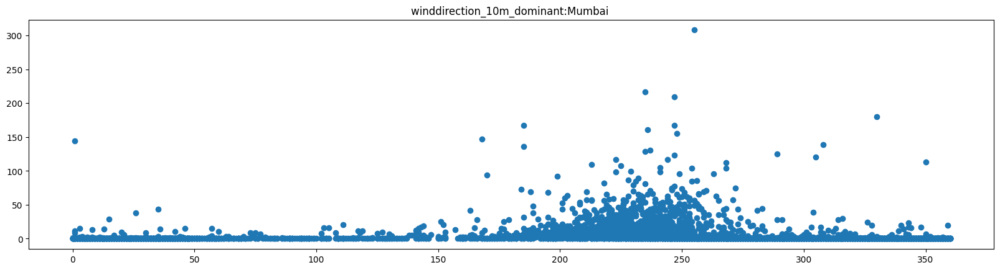

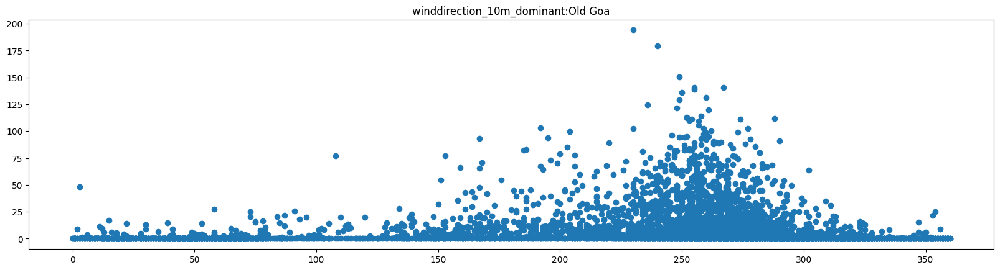

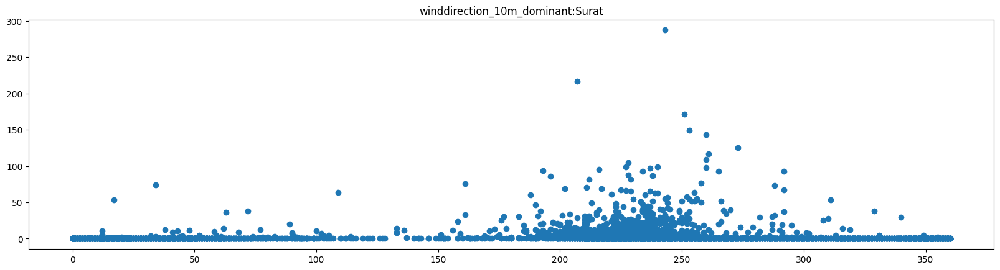

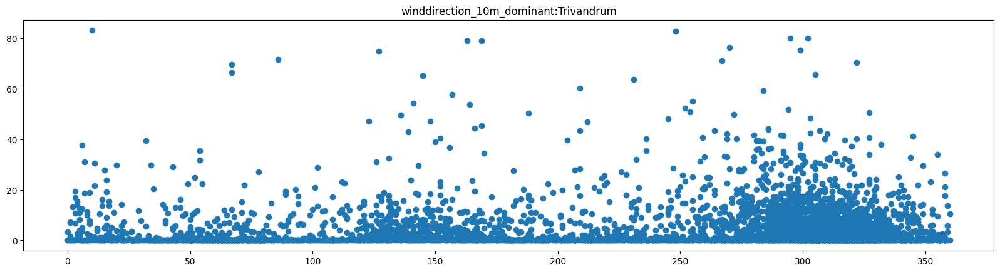

In [28]:
vars = ['temperature_2m_mean', 'et0_fao_evapotranspiration', 'time', 'shortwave_radiation_sum',
        'windgusts_10m_max', 'windspeed_10m_max', 'winddirection_10m_dominant']

for var in vars:
    for city, group_data in df.groupby('city'):
        plt.figure().set_figwidth(20)
        plt.scatter(group_data[var], group_data['precipitation_sum'], label=city)
        plt.title(var + ':' +city)
        plt.show()

# Correlations #

In [29]:
df.groupby('city').precipitation_sum.describe()

,count,mean,std,min,25%,50%,75%,max
city,,,,,,,,
Bhuj,4966.0,1.373983,7.051375,0.0,0.0,0.0,0.000,223.8
Karachi,4966.0,0.499376,3.744586,0.0,0.0,0.0,0.000,119.3
Mangalore,4966.0,7.039368,12.688276,0.0,0.0,1.1,9.000,133.1
Mumbai,4966.0,5.765667,15.752955,0.0,0.0,0.0,4.775,307.9
Old Goa,4966.0,8.943677,18.578621,0.0,0.0,0.1,8.900,194.0
Surat,4966.0,2.989791,11.367842,0.0,0.0,0.0,1.000,287.3
Trivandrum,4966.0,4.860391,8.467165,0.0,0.1,1.6,6.000,83.1


In [30]:
city_corr = pd.pivot_table(df, values = 'precipitation_sum', index = ['time'], columns = ['city'])
city_corr

city,Bhuj,Karachi,Mangalore,Mumbai,Old Goa,Surat,Trivandrum
time,,,,,,,
2010-01-01,0.0,0.0,0.0,0.0,0.1,0.0,0.5
2010-01-02,4.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.4
2010-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
2023-08-02,0.6,0.5,3.4,10.6,17.8,2.2,2.5
2023-08-03,1.0,0.6,5.2,9.2,19.9,1.4,1.9
2023-08-04,0.8,0.0,7.0,6.8,25.2,2.0,1.5


In [31]:
city_corr.corr()

city,Bhuj,Karachi,Mangalore,Mumbai,Old Goa,Surat,Trivandrum
city,,,,,,,
Bhuj,1.000000,0.297772,0.111343,0.225387,0.231255,0.308033,0.036664
Karachi,0.297772,1.000000,0.092878,0.124145,0.141884,0.121553,0.057179
Mangalore,0.111343,0.092878,1.000000,0.338721,0.621648,0.169283,0.415225
Mumbai,0.225387,0.124145,0.338721,1.000000,0.603742,0.428982,0.097624
Old Goa,0.231255,0.141884,0.621648,0.603742,1.000000,0.334074,0.217399
Surat,0.308033,0.121553,0.169283,0.428982,0.334074,1.000000,0.051257
Trivandrum,0.036664,0.057179,0.415225,0.097624,0.217399,0.051257,1.000000


## Evapotranspiration ##

In [32]:
def inv(x,a, b, c):
    return a * np.exp(-b*x) + c

equation: 147.72405025724527e^(-1.0494234794792394x) + -0.3401783182436712
Correlation: 0.6500878428935226


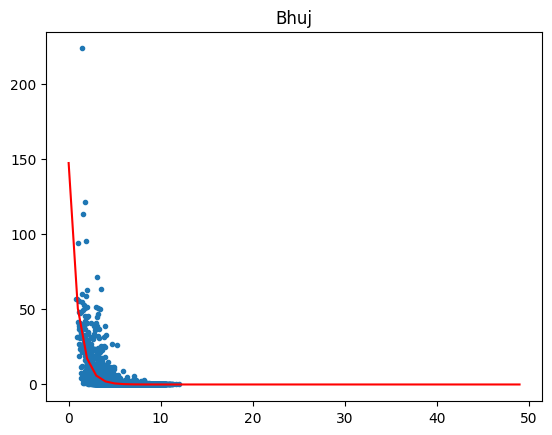

equation: 244.67502553165343e^(-66.6249167644418x) + 0.4993757692822587
Correlation: 1.5935272138365063e-16


c:\Users\nicks\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


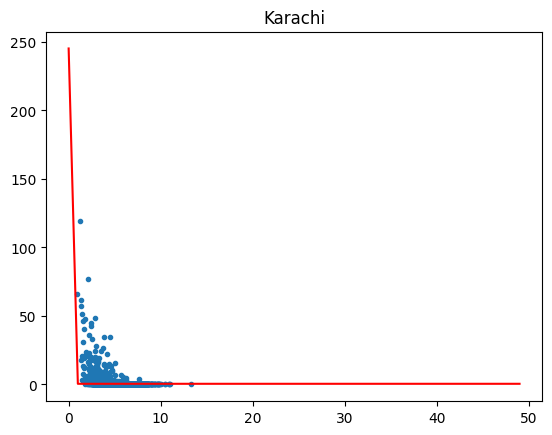

equation: 91.1383446340022e^(-0.6497595943740656x) + -3.091412983354875
Correlation: 0.7904731998308239


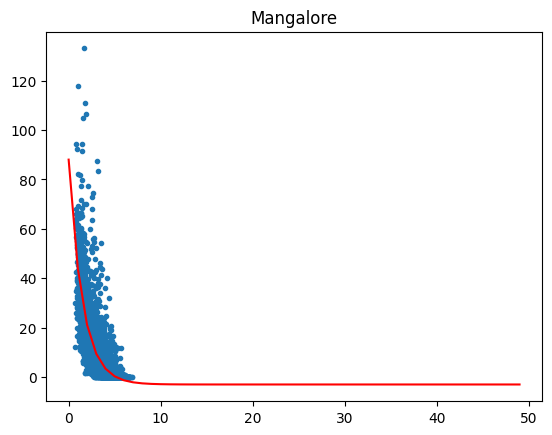

equation: 174.49733508756646e^(-0.9828457991613347x) + -1.1589840585261666
Correlation: 0.7512183660086027


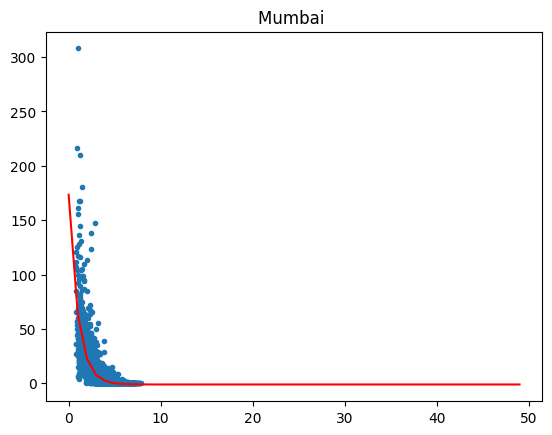

equation: 138.9487669046826e^(-0.6974628595161846x) + -4.432908212387425
Correlation: 0.8040214945420897


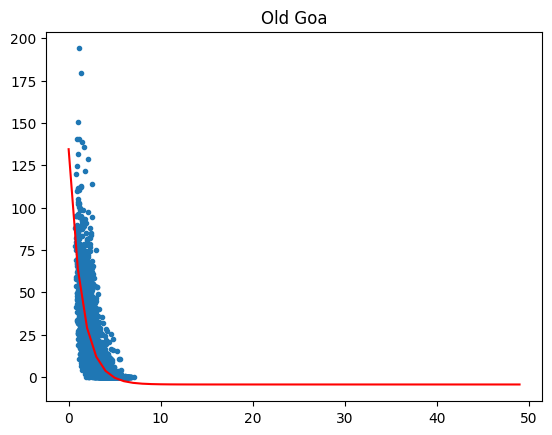

equation: 215.68637400344167e^(-1.1573486143988454x) + -0.19615575078336633
Correlation: 0.7180041620005814


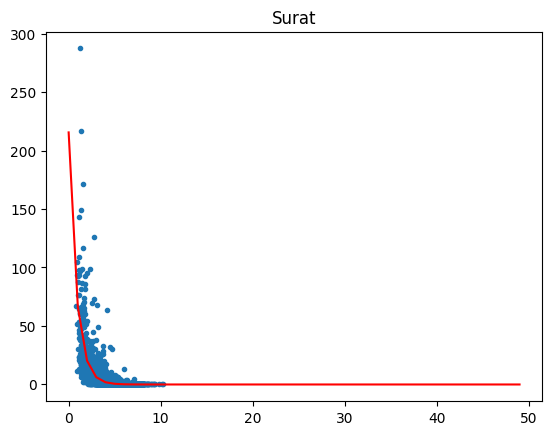

equation: 90.4264830188123e^(-0.7454314994706838x) + -1.8181449420711493
Correlation: 0.7121806843776155


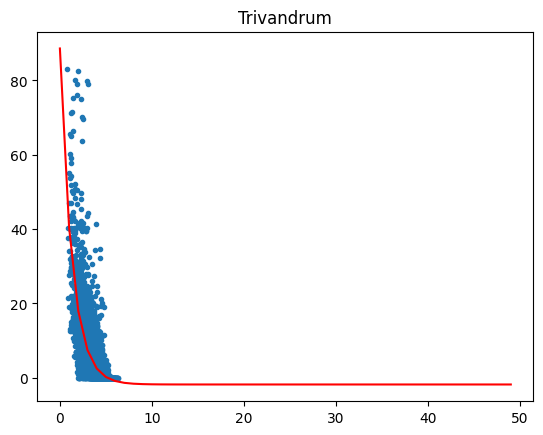

In [33]:
cities = ['Karachi', 'Bhuj', 'Mangalore', 'Trivandrum', 'Old Goa', 'Mumbai', 'Surat']
for city,group_data in df.groupby('city'):
    dfnew = df[df['city'] == city]
    popt, pcov = curve_fit(inv, dfnew['et0_fao_evapotranspiration'], dfnew['precipitation_sum'])
    print('equation: ' + str(popt[0])+ 'e^(-' + str(popt[1]) +'x) + ' + str(popt[2]))
    vals = []
    for val in dfnew['et0_fao_evapotranspiration']:
        vals.append(inv(val, *popt))
    corr = np.corrcoef(dfnew['precipitation_sum'], vals)
    print('Correlation: '+ str(corr[0,1]))
    plt.plot(dfnew['et0_fao_evapotranspiration'], dfnew['precipitation_sum'],'.')
    plt.plot(inv(np.linspace(0,50), *popt), 'r-')
    plt.title(city)
    plt.show()

## Shortwave Radiation ##

equation: 129.92948420059173e^(-0.2943586763048159x) + 0.1011078574611789

c:\Users\nicks\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)



0.6755042035056108


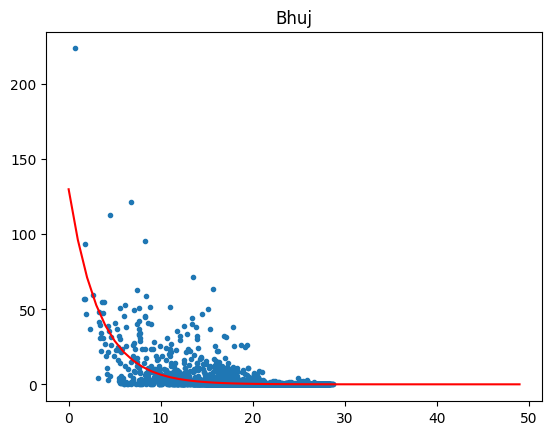

equation: 104.58084410489877e^(-0.29424811616568286x) + -0.22994685828522388
0.6595002917090869


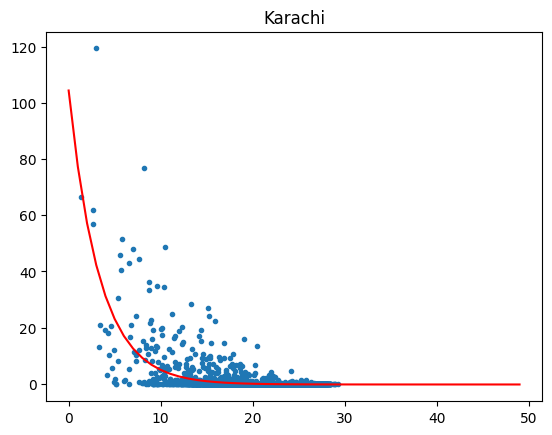

equation: 76.93196408590204e^(-0.10148349191393645x) + -7.209194029434227
0.7843967266501894


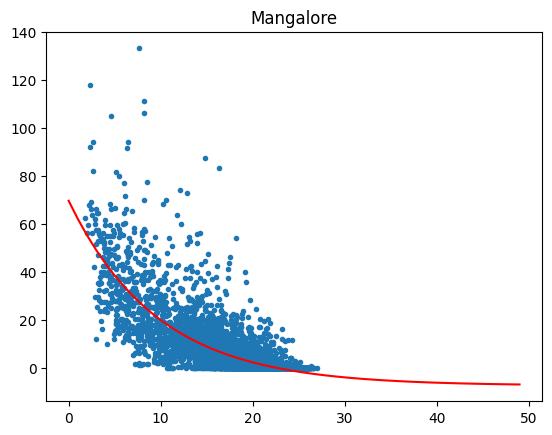

equation: 122.95810135197226e^(-0.19590095506800306x) + -1.053072557849061
0.7576518743674742


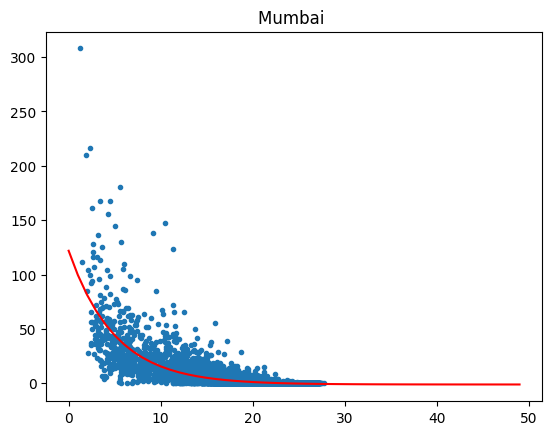

equation: 110.74078525781628e^(-0.1163771007597784x) + -8.069529881387682
0.7809731391125849


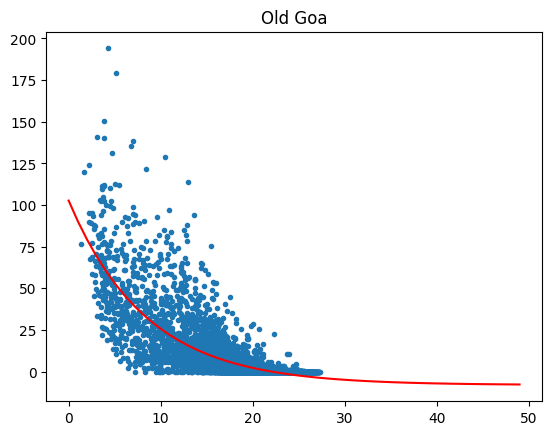

equation: 142.81981825220797e^(-0.27724134657721683x) + 0.24696778336296554
0.7255361579347203


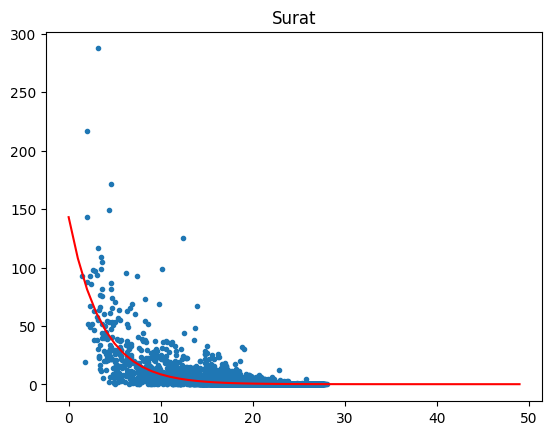

equation: 66.43984567809727e^(-0.1215103993237325x) + -2.8897488543951937
0.6815053517284673


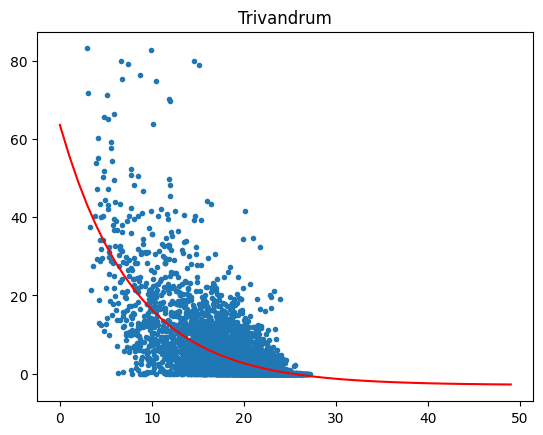

In [34]:
cities = ['Karachi', 'Bhuj', 'Mangalore', 'Trivandrum', 'Old Goa', 'Mumbai', 'Surat']
for city,group_data in df.groupby('city'):
    dfnew = df[df['city'] == city]
    popt, pcov = curve_fit(inv, dfnew['shortwave_radiation_sum'], dfnew['precipitation_sum'],)
    print('equation: ' + str(popt[0])+ 'e^(-' + str(popt[1]) +'x) + ' + str(popt[2]))
    vals = []
    for val in dfnew['shortwave_radiation_sum']:
        vals.append(inv(val, *popt))
    corr = np.corrcoef(dfnew['precipitation_sum'], vals)
    print(corr[0,1])
    plt.plot( dfnew['shortwave_radiation_sum'], dfnew['precipitation_sum'], '.')
    plt.plot(inv(np.linspace(0,50), *popt), 'r-')
    plt.title(city)
    plt.show()

## Temperature ##

Equation: 0.1405110051298316 + 4.489104907930021 * np.exp(-(x - 26.674145797837742) ** 2 / (2 * 1.1928100673403006 ** 2)
Correlation: 0.07646420804320402


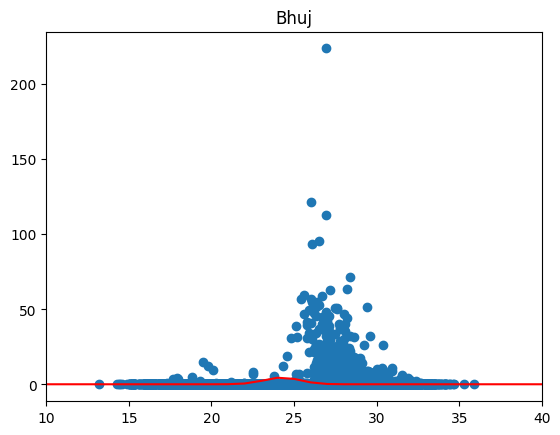

Equation: 0.17581571547859917 + 1.0231234583255513 * np.exp(-(x - 27.79072346546736) ** 2 / (2 * 1.0068150983080015 ** 2)
Correlation: 0.376377487961174


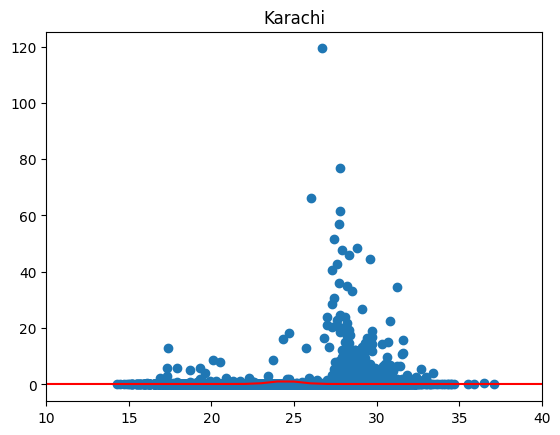

Equation: 1.541109144335931 + 32.08907837045208 * np.exp(-(x - 23.686298494138782) ** 2 / (2 * 1.244194808607412 ** 2)
Correlation: -0.8062236910655245


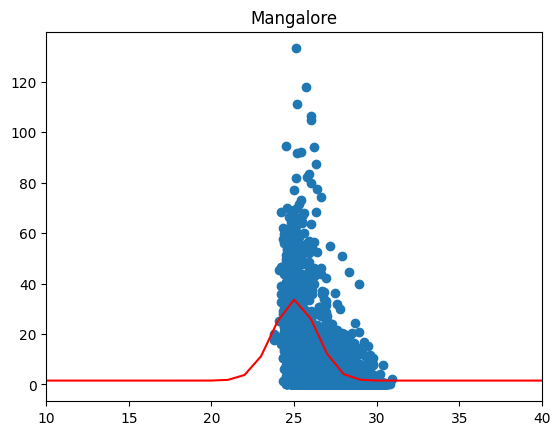

Equation: 0.5221562277715884 + 15.417227074616187 * np.exp(-(x - 26.116475366693496) ** 2 / (2 * 0.6702879350142731 ** 2)
Correlation: -0.24260414906161104


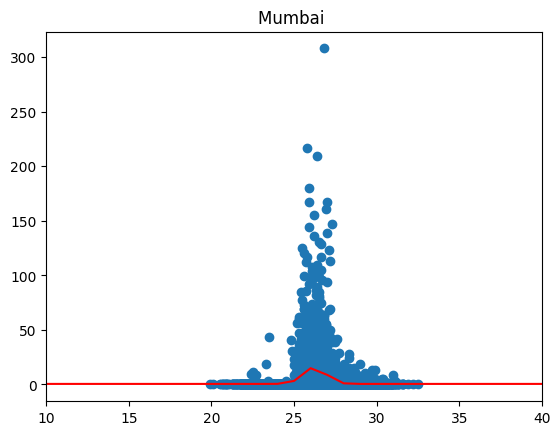

Equation: 1.9546331055164745 + 22.27302990085142 * np.exp(-(x - 25.80261668716699) ** 2 / (2 * 0.6545048000994035 ** 2)
Correlation: -0.5891870625419379


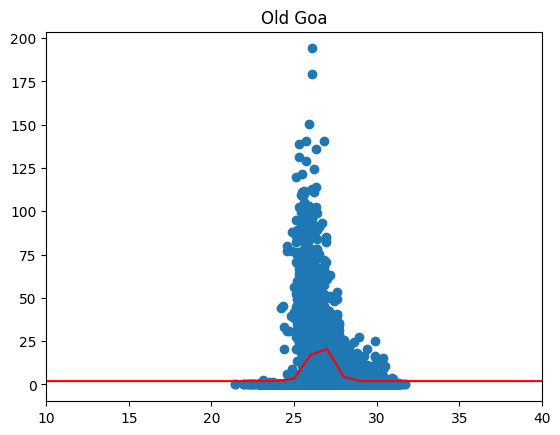

Equation: 0.6294816387341555 + 11.581363929689338 * np.exp(-(x - 26.146966736594003) ** 2 / (2 * 0.6648954856896673 ** 2)
Correlation: -0.12295924861312346


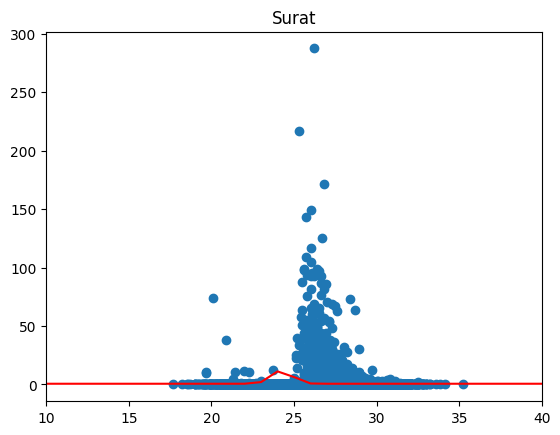

Equation: 1.977244039032743 + 73.64491208160538 * np.exp(-(x - 22.190731349052506) ** 2 / (2 * 1.300976787227162 ** 2)
Correlation: -0.7286471697182366


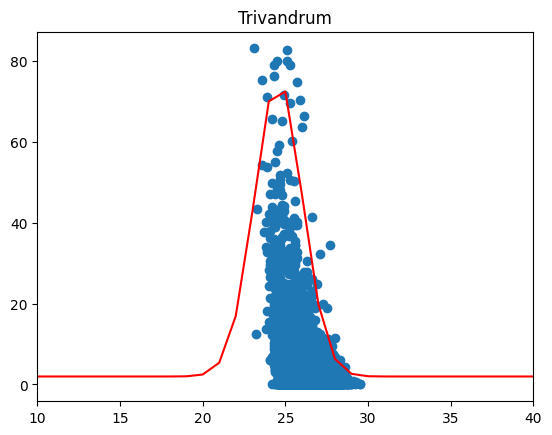

In [35]:
def gauss(x,h, a, x0, sigma):
    return h + a * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))

for city,group_data in df.groupby('city'):
    dfnew = df[df['city'] == city]
    x = dfnew['temperature_2m_mean']
    y = dfnew['precipitation_sum']

    mean = sum(x * y) / sum(y)
    sigma = np.sqrt(sum(y * (x - mean) ** 2) / sum(y))

    popt, pcov = curve_fit(gauss,x, y, p0=[min(y), max(y),mean,sigma])
    
    print('Equation: {} + {} * np.exp(-(x - {}) ** 2 / (2 * {} ** 2)'.format(str(popt[0]), str(popt[1]), str(popt[2]), str(popt[3])))

    vals = []
    for val in x:
        vals.append(gauss(val, *popt))
    corr = np.corrcoef(x, vals)
    print('Correlation: '+ str(corr[0,1]))

    plt.scatter(x, y)
    plt.plot(gauss(np.linspace(0, (max(x)*1.5)), *popt), 'r-') #Yea it's a little janky for the visual, take it with a grain of salt, just read the equation
    plt.title(city)
    plt.xlim(10,40)
    plt.show()

## Windspeed ##

equation: 0.06608396056534582x + -0.07075122174986204
[0.9733753551826021, 0.6033051760166653, 1.3037951580093312, 1.2178860092743815, 0.847815830108445, 0.8081654537692374, 1.065892899974086, 1.1584104447655703, 1.2641447816701235, 1.3037951580093312, 1.1650188408221047, 1.1716272368786396, 1.178235632935174, 1.508655435761903, 1.1319768605394318, 0.861032622221514, 0.7883402655996337, 0.7949486616561682, 0.7949486616561682, 0.9072913946172562, 0.8147738498257721, 0.8081654537692374, 0.8676410182780486, 0.9271165827868598, 1.290578365896262, 0.7685150774300299, 0.6892143247516149, 0.7156479089777533, 0.7751234734865645, 0.7751234734865645, 0.8015570577127028, 0.8081654537692374, 0.7685150774300299, 0.7883402655996337, 0.6363471562993382, 0.9799837512391365, 0.9667669591260672, 1.0130257315218094, 2.030718724228135, 1.5549142081576453, 1.0262425236348787, 1.4095294949138844, 1.2046692171613125, 1.396312702800815, 1.2839699698397273, 0.9072913946172562, 1.2707531777266583, 1.33683713829

c:\Users\nicks\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


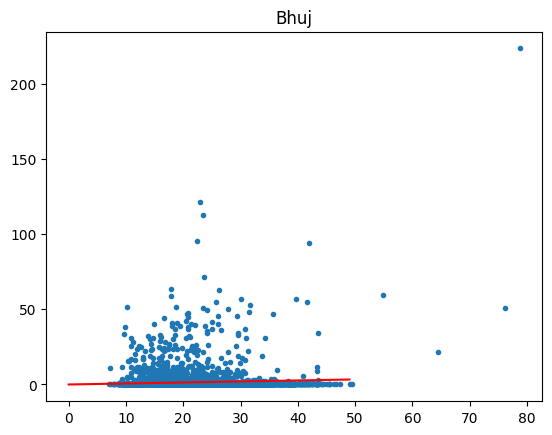

equation: 0.01851331978460924x + 0.05466687659698655
[0.39346062865533565, 0.5100945432983739, 0.3619879850214999, 0.3138533535815159, 0.4119739484399449, 0.3656906489784218, 0.4212306083322495, 0.5341618590183659, 0.5156485392337566, 0.42678460426763226, 0.5230538671476004, 0.33792066930150794, 0.28423204192614115, 0.34902866117227344, 0.3675419809568827, 0.43974392811685875, 0.38790663271995285, 0.24720540235692265, 0.26016472620614906, 0.3231100134738205, 0.3860553007414919, 0.38420396876303103, 0.3990146245907184, 0.3082993576461331, 0.34902866117227344, 0.3564339890861172, 0.3749473088707264, 0.456405915923007, 0.42863593624609314, 0.32496134545228145, 0.39160929667687466, 0.4212306083322495, 0.28423204192614115, 0.4934325554922255, 0.3656906489784218, 0.3212586814953596, 0.3082993576461331, 0.3286640094092033, 0.7007817370798489, 0.4934325554922255, 0.5767424945229671, 0.6248771259629511, 0.3564339890861172, 0.2879347058830629, 0.38790663271995285, 0.48787855955684273, 0.42863593

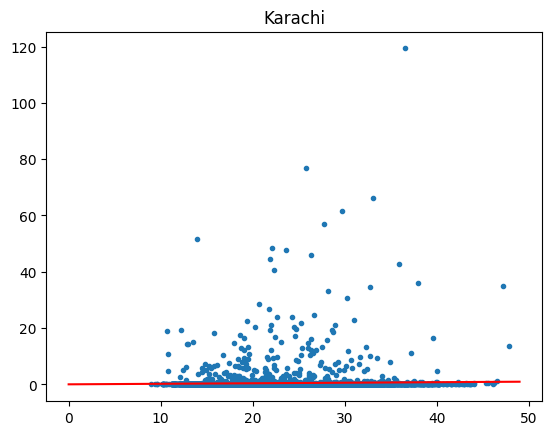

equation: 1.1450957657580787x + -11.993064722055244
[-2.145241136535768, 2.0916131967691243, 1.6335748904658924, 3.92376642198205, 3.5802376922546255, 0.9465174310110456, 4.839843034588512, 1.061027007586853, 4.496314304861091, 1.977103620193315, 3.8092568454062423, 1.6335748904658924, 3.8092568454062423, -0.08406875817122561, 0.14495039498038942, 2.435141926496547, 3.694747268830433, 1.977103620193315, 8.275130331862748, 2.6641610796481636, 4.954352611164321, 4.610823881436897, 5.52690049404336, 3.3512185391030105, 4.381804728285282, 2.8931802327997787, 5.412390917467551, 6.213957953498209, 7.015524989528863, 6.442977106649824, 4.038275998557857, 4.954352611164321, 7.9316016021353235, 8.160620755286942, 7.244544142680478, 7.588072872407903, 5.64141007061917, 5.64141007061917, 7.817092025559518, 7.9316016021353235, 5.412390917467551, 5.297881340891742, 14.57315704353218, 9.420226097620827, 7.588072872407903, 7.817092025559518, 4.496314304861091, 3.8092568454062423, 6.786505836377245, 4

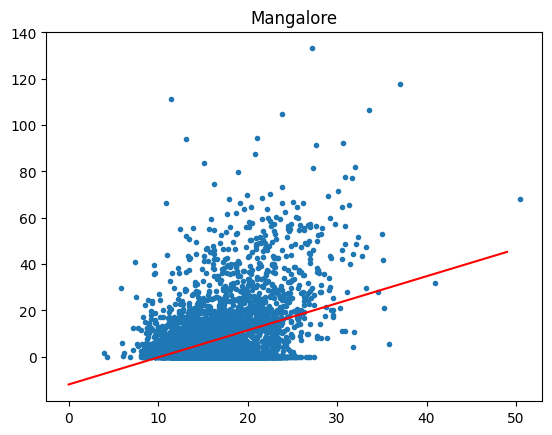

equation: 1.476183481804859x + -19.760268761515913
[-0.5698834980527465, -0.7175018462332332, 5.630087125527659, 9.320545830039805, 1.2015366801130831, -1.0127385425942066, 1.939628421015513, 0.3158265910301665, -1.0127385425942066, -2.193685328038093, 2.9729568582789128, 4.744377036444746, 10.944347660025151, 3.268193554639886, 2.8253385100984296, -1.1603568907746897, 2.8253385100984296, 3.7110485991813427, 1.6443917246545396, -0.12702845351129, -0.12702845351129, -1.1603568907746897, 2.2348651173764864, 0.7586816355716266, 0.4634449392106532, -0.7175018462332332, -2.193685328038093, 2.2348651173764864, 5.187232080986199, 1.0539183319325964, 1.3491550282935698, 6.958652259152036, 6.220560518249606, 3.1205752064593995, 2.9729568582789128, 1.6443917246545396, 0.9062999837521097, 1.4967733764740565, 6.663415562791059, 1.0539183319325964, 6.811033910971549, 6.368178866430089, 1.939628421015513, 6.368178866430089, 4.891995384625229, 1.7920100728350263, 9.172927481859322, 6.958652259152036,

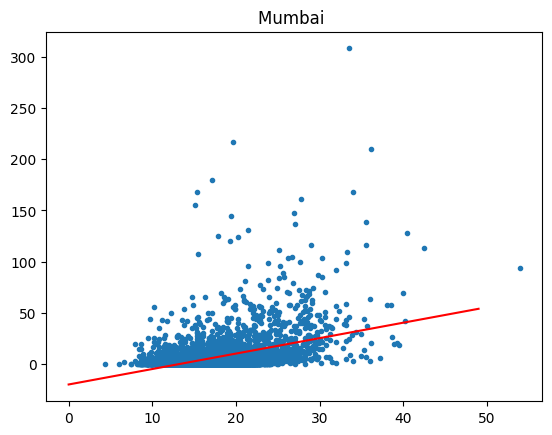

equation: 2.5928056269619795x + -27.958170639477135
[-4.62291999681932, 0.8219718198008366, 9.378230388775368, 9.378230388775368, 14.304561080003129, 6.785424761813392, 7.563266449901985, 1.0812523824970341, 9.378230388775368, 3.414777446762816, 1.8590940705856305, -2.807956057945937, 4.192619134851409, -2.0301143698573405, 8.600388700686775, 18.1937695204461, 8.859669263382973, 4.192619134851409, 2.1183746332818245, 13.267438829218339, -1.770833807161143, 4.970460822940002, 3.9333385721552148, 8.341108137990577, 4.192619134851409, 3.9333385721552148, 4.192619134851409, 11.19319432764875, 2.896216321370421, 4.711180260243804, 9.896791514167763, 9.378230388775368, 11.452474890344948, 9.896791514167763, 14.304561080003129, 7.303985887205787, 6.007583073724792, 6.526144199117194, 16.378805581572717, 16.638086144268907, 9.896791514167763, 6.526144199117194, 11.711755453041153, 13.008158266522141, 7.822547012598182, 9.896791514167763, 9.896791514167763, 13.008158266522141, 8.08182757529438,

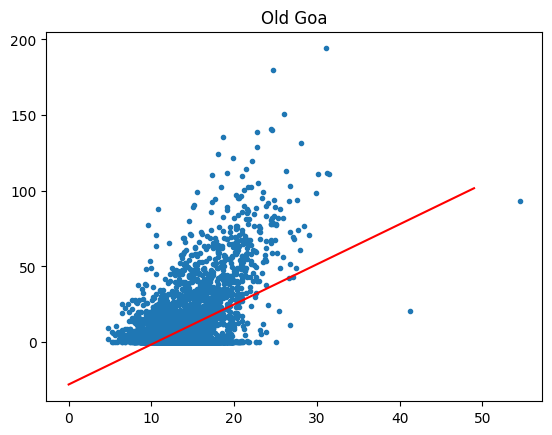

equation: 0.4848930245810583x + -6.581710661061965
[3.5040642502240473, 1.6129814543579197, 4.3283823920118465, 3.4555749477659408, 2.825214015810566, 1.6129814543579197, 1.1765777322349678, 2.0493851764808735, 3.0676605281010954, 3.3585963428497294, 2.7767247133524613, 2.534278201061932, 3.69802146005647, 3.6495321575983652, 2.000895874022767, 0.25528098553095635, -0.4235692488825249, 0.5947061027376979, 0.9341312199444385, -0.13263343413388906, -0.18112273659199563, -1.7327804152513817, -1.4903339029608533, 0.25528098553095635, 0.10981307815664021, -0.32659064396631265, -0.47205855134063057, -1.0539301808379005, 0.5947061027376979, 0.7401740101120149, -1.0054408783797948, -0.6660157611730542, -0.6175264587149476, 0.012834473240427968, -1.4418446005027477, -1.3448659955865354, -1.1024194832960061, -0.7145050636311598, 0.7401740101120149, 2.0978744789389783, 1.8069386641903442, 0.9341312199444385, 1.3220456396092857, 2.146363781397085, 0.6916847076539092, 0.7401740101120149, 0.64319540

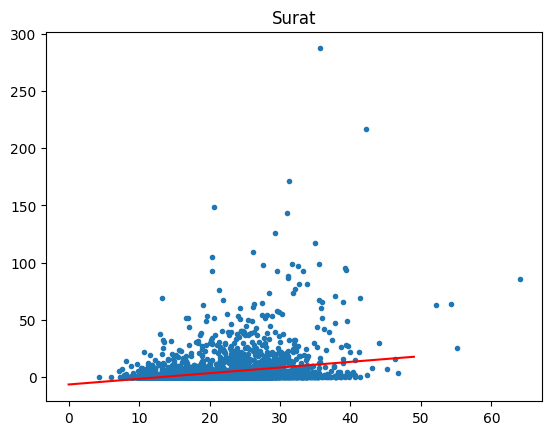

equation: 0.373220085372135x + -1.2825218679831691
[1.9644928747544055, 3.2334411650196646, 4.203813386987216, 3.9425593272267214, 4.35310142113607, 3.2334411650196646, 4.017203344301148, 4.054525352838362, 2.7109330454986758, 2.897543088184743, 2.375034968663754, 2.934865096721957, 1.9271708662171918, 3.0841531308708108, 4.203813386987216, 4.054525352838362, 3.9425593272267214, 3.308085182094092, 4.017203344301148, 4.5023894552849235, 3.5693392418545864, 4.800965523582632, 4.950253557731486, 4.6889994979709915, 4.427745438210497, 4.726321506508206, 4.35310142113607, 3.5693392418545864, 4.24113539552443, 5.21150761749198, 5.659371719938543, 5.95794778823625, 5.696693728475756, 5.472761677252476, 5.584727702864115, 5.099541591880341, 4.24113539552443, 4.539711463822138, 5.8086597540873965, 5.510083685789688, 4.9875755662687, 2.0764589003660463, 4.129169369912789, 4.763643515045418, 5.73401573701297, 5.360795651640835, 4.912931549194273, 3.643983258929013, 4.6889994979709915, 5.062219583

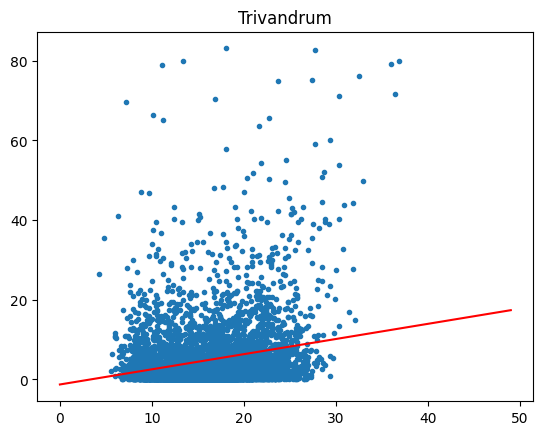

In [36]:
def line(x,a, b, c):
    return a*x + b

for city,group_data in df.groupby('city'):
    dfnew = df[df['city'] == city]
    popt, pcov = curve_fit(line, dfnew['windspeed_10m_max'], dfnew['precipitation_sum'])
    print('equation: ' + str(popt[0])+ 'x + ' + str(popt[1]))
    vals = []
    for val in dfnew['windspeed_10m_max']:
        vals.append(line(val, *popt))
        
    corr = np.corrcoef(dfnew['precipitation_sum'], vals)
    print('Correlation: ' + str(corr[0,1]))
    plt.plot(dfnew['windspeed_10m_max'], dfnew['precipitation_sum'],'.')
    plt.plot(line(np.linspace(0,50), *popt), 'r-')
    plt.title(city)
    plt.show()

## Windgusts ##

equation: 0.045167418024804507x + -0.3120867949760837
Correlation: 0.07118722714680348


c:\Users\nicks\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


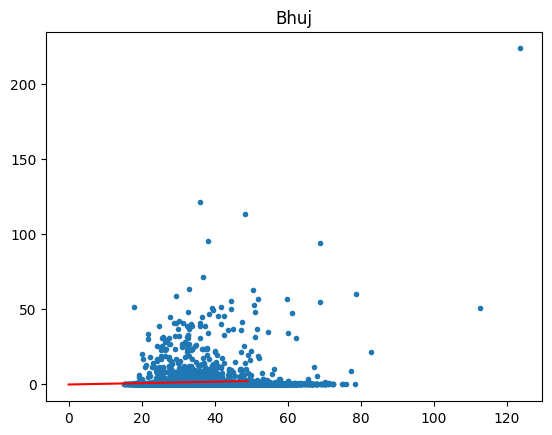

equation: 0.0187313818207225x + -0.21223837414349736
Correlation: 0.046867500402528954


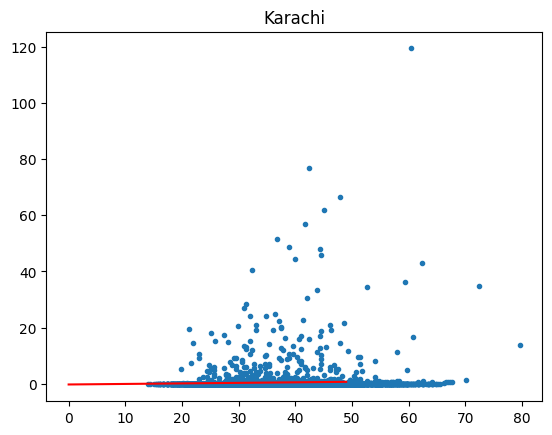

equation: 0.7758372817947183x + -17.570937657543613
Correlation: 0.5085086505193211


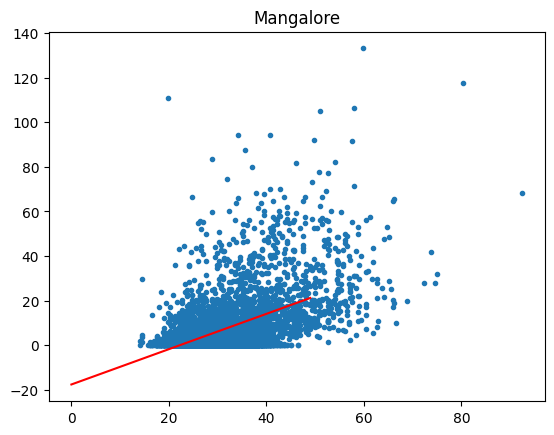

equation: 0.8924375626848392x + -21.953595113699333
Correlation: 0.4748716848049826


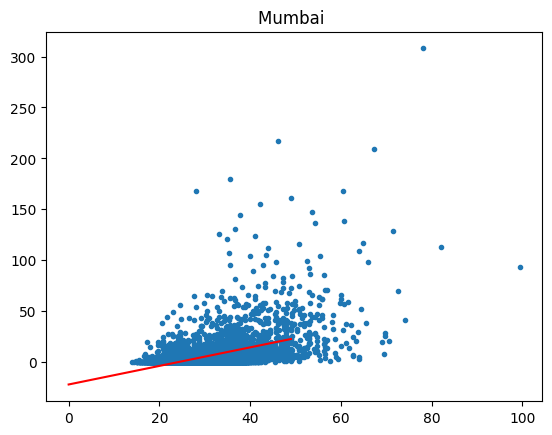

equation: 1.4007140271338372x + -39.74154348338705
Correlation: 0.5602092778220877


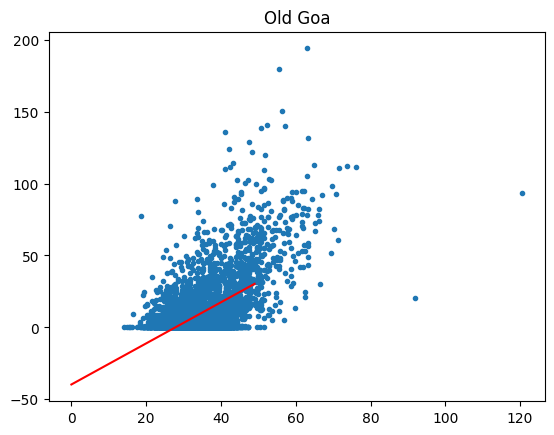

equation: 0.34165778608551967x + -7.951679623574659
Correlation: 0.3093746467987908


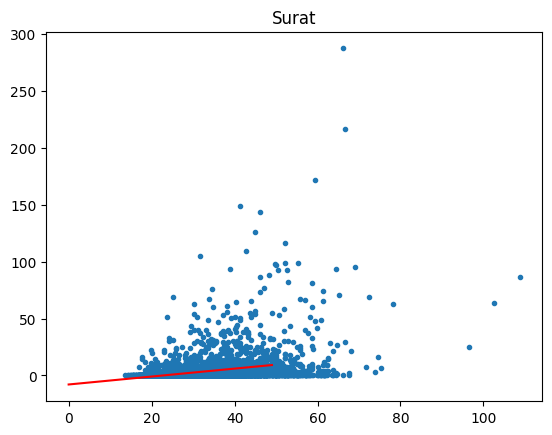

equation: 0.256332512306833x + -3.6995564060927597
Correlation: 0.2615894902914406


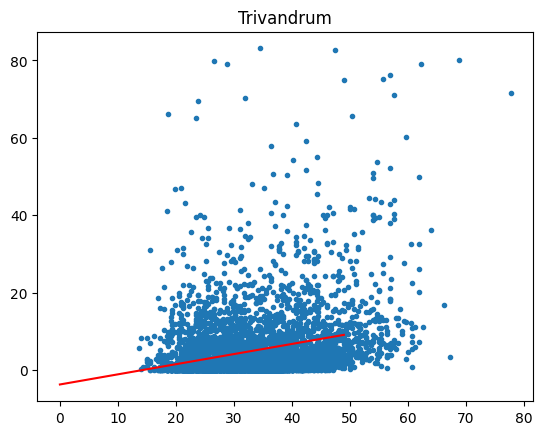

In [37]:
def line(x,a, b, c):
    return a*x + b

for city,group_data in df.groupby('city'):
    dfnew = df[df['city'] == city]
    popt, pcov = curve_fit(line, dfnew['windgusts_10m_max'], dfnew['precipitation_sum'])
    print('equation: ' + str(popt[0])+ 'x + ' + str(popt[1]))
    vals = []
    for val in dfnew['windgusts_10m_max']:
        vals.append(line(val, *popt))
    corr = np.corrcoef(dfnew['precipitation_sum'], vals)
    print('Correlation: '+ str(corr[0,1]))

    plt.plot(dfnew['windgusts_10m_max'], dfnew['precipitation_sum'],'.')
    plt.plot(line(np.linspace(0,50), *popt), 'r-')
    plt.title(city)
    plt.show()